# Latent Diffusion and Perceptual Latent Loss to Generate Church images

In today's post, we will build Latent Diffusion models to generate Church images at reduced training times using latents and using a pre-trained ImageNet latent classifier as a component to add perceptual loss. We will be using LSUN Church dataset, trained for 30 epochs on our U-Net model. We will first train a U-Net model with just MSE loss to sample our Church images, and then intorduce the a perceptual loss function in the mix to see how it affects the generated samples.The intuition behind using the Imagenet latent classifier to add perceptual loss is that the model has learnt about images in the latent space and its parameters have captured information about features of images, all in the compressed latent space.By focusing on high-level features, perceptual loss function can produce results that align better with human visual perception, leading to higher-quality image generation. Let's dive into the notebook and understand the entire process piece by piece.

The notebook is structured as follows
- We compress(encode) the LSUN Church dataset using sd-vae-ft-ema VAE.These latents map 3 channel 256 x 256 pixel images down by a spatial resolution factor of 8 to 4 channels 32 x 32 latents.
- Then we add noise to these latent images using Linear Noise scheduler and train a U-Net model to predict noise in an image which is in the latent space using these encoded latents. First the model is trained just with MSE loss, then perceptual loss is added to create a combined loss function. The perceptual loss is added courtesy of a external network trained on the entire Imagenet Dataset in the latent space.
- Using DDIM sampler, we generate Church images.

## Imports

In [2]:
!pip install -Uqq git+https://github.com/fastai/course22p2

In [3]:
%%capture
!pip install git+https://github.com/huggingface/transformers

In [4]:
%%capture
!pip install accelerate

In [5]:
import timm, torch, random, datasets, math, fastcore.all as fc, numpy as np, matplotlib as mpl, matplotlib.pyplot as plt
import torchvision.transforms as T
import torchvision.transforms.functional as TF,torch.nn.functional as F

from torch.utils.data import DataLoader,default_collate
from pathlib import Path
from torch.nn import init
from fastcore.foundation import L
from torch import nn,tensor
from datasets import load_dataset
from operator import itemgetter
from torcheval.metrics import MulticlassAccuracy
from functools import partial
from torch.optim import lr_scheduler
from torch import optim
from torchvision.io import read_image,ImageReadMode

from miniai.datasets import *
from miniai.conv import *
from miniai.learner import *
from miniai.activations import *
from miniai.init import *
from miniai.sgd import *
# from miniai.resnet import *
from miniai.augment import *
from miniai.accel import *
from miniai.training import *

In [6]:
# from miniai.imports import *
from miniai.diffusion import *

from glob import glob
from fastprogress import progress_bar
from diffusers import AutoencoderKL, UNet2DConditionModel

In [7]:
import timm

In [8]:
torch.set_printoptions(precision=4, linewidth=140, sci_mode=False)
torch.manual_seed(1)
mpl.rcParams['image.cmap'] = 'gray_r'
mpl.rcParams['figure.dpi'] = 70

set_seed(42)
if fc.defaults.cpus>8: fc.defaults.cpus=8

## Data 

We will start off by compressing the LSUN Church dataset images into VAE encoded latents. 

In [8]:
path_data = Path('data')
path_data.mkdir(exist_ok=True)
path = path_data/'church'

In [9]:
bs = 64

In [10]:
def to_img(f): return read_image(f, mode=ImageReadMode.RGB)/255

We read each file and convert it into a 256X256 image. Remember, VAE encodes 256X256 images into 32X32 in the latent space(and 64X64 for 512X512 images). 
We do need the images to be of same size to pass it to VAE decoder in batches. 

In [12]:
class ImagesDS:
    def __init__(self, spec):
        self.path = Path(path)
        self.files = glob(str(spec), recursive=True)
    def __len__(self): return len(self.files)
    def __getitem__(self, i): return to_img(self.files[i])[:, :256,:256]

In [13]:
ds = ImagesDS(path/f'**/*.jpeg')

In [14]:
len(ds)

126227

Let's have a look into our dataset

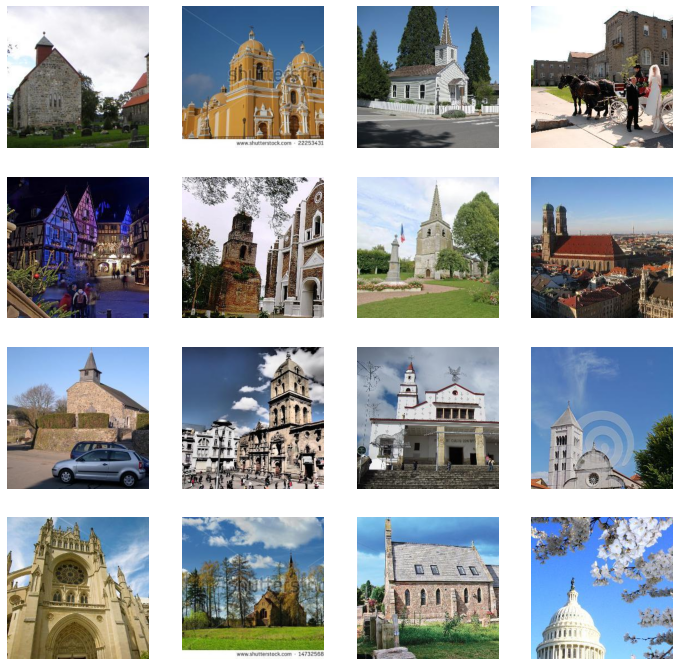

In [17]:
dl = DataLoader(ds, batch_size=bs, num_workers=fc.defaults.cpus)
xb = next(iter(dl))
show_images(xb[:16], imsize=3)

In [9]:
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-ema").cuda().requires_grad_(False)

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

In [19]:
xe = vae.encode(xb.cuda())

In [20]:
xs = xe.latent_dist.mean[:16]
xs.shape

torch.Size([16, 4, 32, 32])

The below cell shows that the encoded images are 48 times smaller than the original pixel images requiring 48 times less memory and less compute.

In [21]:
(16*3*256*256)/(16*4*32*32)

48.0

Let's visualise the images in the latent space

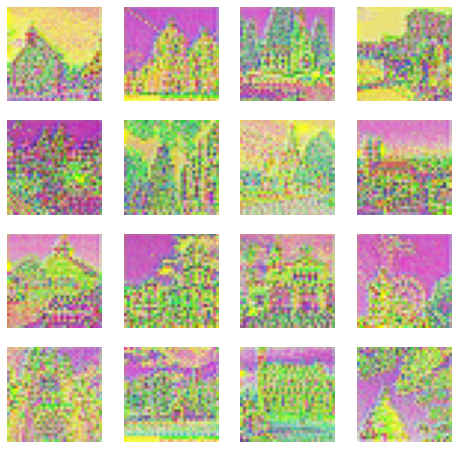

In [22]:
show_images(((xs[:16,:3])/4).sigmoid(), imsize=2)

The smaller encoded images are no good, if they can't be transformed into their original form without losing its characteristics and visuals. We decode them using VAE and they look as good as the originals. 

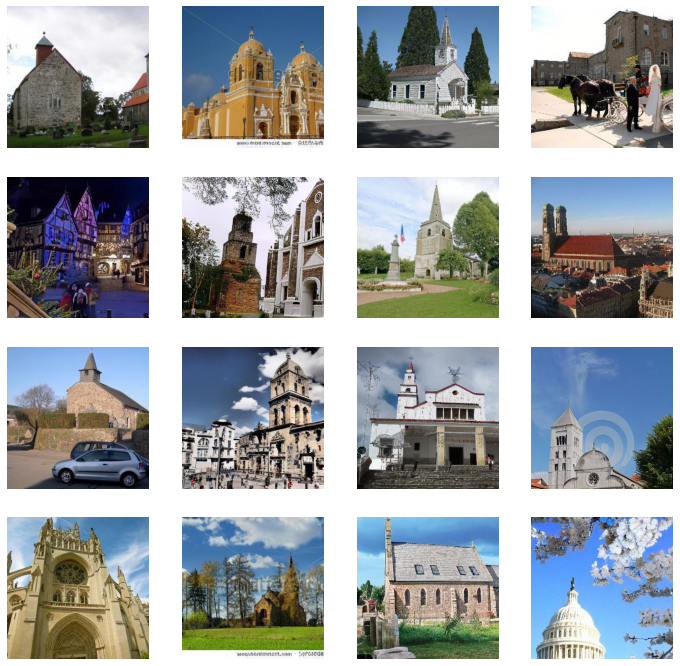

In [23]:
xd = to_cpu(vae.decode(xs))
show_images(xd['sample'].clamp(0,1), imsize=3)

### Memory mapped numpy file

We are going to store our latent data into a memory mapped numpy file. Whatever memory numpy uses in RAM, is copied to the disk and all operations are written onto disk as well.Even though it is on disk, it still uses caching to get the data on RAM which you are using at a particular instance without comprimising speed.

In [8]:
mmpath = Path('data/church/data.npmm')

The first dimension is the number of images in our dataset

In [9]:
mmshape = (126227,4,32,32)

We go through the dataset, encode it as a (4,32,32) latent image, and save it on disk.

In [24]:
if not mmpath.exists():
    a = np.memmap(mmpath, np.float32, mode='w+', shape=mmshape)
    i = 0
    for b in progress_bar(dl):
        n = len(b)
        a[i:i+n] = to_cpu(vae.encode(b.cuda()).latent_dist.mean).numpy()
        i += n
    a.flush()
    del(a)

In [10]:
lats = np.memmap(mmpath, dtype=np.float32, mode='r', shape=mmshape)

In [28]:
b = torch.tensor(lats[:16])

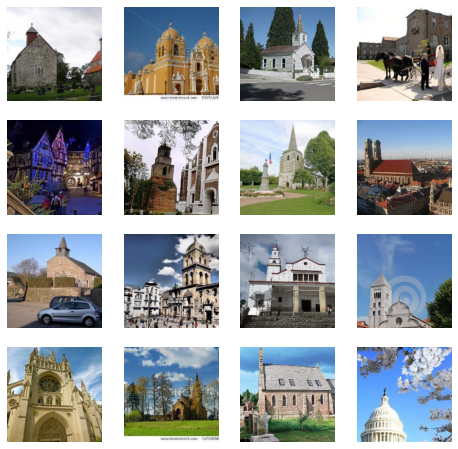

In [29]:
xd = to_cpu(vae.decode(b.cuda()))
show_images(xd['sample'].clamp(0,1), imsize=2)

# Noisify

The following section, adds noise to our latents which the U-Net model will be trained to predict. We use the simple linear noise scheduler.

In [11]:
def collate_ddpm(b): return noisify(default_collate(b)*0.2)

In [12]:
n = len(lats)

Splitting data into 90% train and 10% validation.

In [13]:
tds = lats[:n//10*9 ]
vds = lats[ n//10*9:]

In [14]:
bs = 128

In [15]:
dls = DataLoaders(*get_dls(tds, vds, bs=bs, num_workers=fc.defaults.cpus, collate_fn=collate_ddpm))

In [16]:
len(dls.train)

888

In [17]:
import warnings

In [18]:
warnings.simplefilter('ignore', UserWarning)

In [19]:
(xt,t),eps = b = next(iter(dls.train))

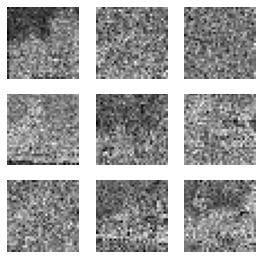

In [21]:
show_images(xt[:9,0], imsize=1.5)

We can see the different noise levels added to different images according to the noise scheduler.

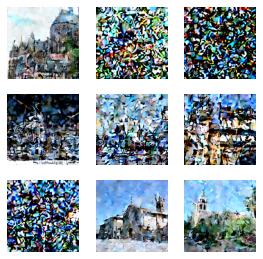

In [22]:
xte = vae.decode(xt[:9].cuda()*5)['sample']
show_images(xte.clamp(0,1), imsize=1.5)

# Train

First we are going to train with just MSE loss function. Learner is the custom class from the MiniAi library which implements the training loop. 
- As we saw we have 126227 Church images in our dataset
     - We are going to train our U-Net model to predict noise in these images to be later used with a DDIM sampler to generate Church images 
- cbs is one or a list of Callbacks to pass to the Learner. Callbacks are used for every tweak of the training loop.

In [18]:
class Learner():
    def __init__(self, model, dls=(0,), loss_func=F.mse_loss, lr=0.1, cbs=None, opt_func=optim.SGD):
        cbs = fc.L(cbs)
        fc.store_attr()

    @with_cbs('batch')
    def _one_batch(self):
        self.predict()
        self.callback('after_predict')
        self.get_loss()
        self.callback('after_loss')
        if self.training:
            self.backward()
            self.callback('after_backward')
            self.step()
            self.callback('after_step')
            self.zero_grad()

    @with_cbs('epoch')
    def _one_epoch(self):
        for self.iter,self.batch in enumerate(self.dl): self._one_batch()

    def one_epoch(self, training):
        self.model.train(training)
        self.dl = self.dls.train if training else self.dls.valid
        self._one_epoch()

    @with_cbs('fit')
    def _fit(self, train, valid):
        for self.epoch in self.epochs:
            if train: self.one_epoch(True)
            if valid: torch.no_grad()(self.one_epoch)(False)

    def fit(self,eps, betas=(0.9, 0.999), weight_decay=0.01,n_epochs=1, train=True, valid=True, cbs=None, lr=None, amsgrad=False,forEach=None,maximize=False,capturable=False):
        cbs = fc.L(cbs)
        # `add_cb` and `rm_cb` were added in lesson 18
        for cb in cbs: self.cbs.append(cb)
        try:
            self.n_epochs = n_epochs
            self.epochs = range(n_epochs)
            if lr is None: lr = self.lr
            if self.opt_func: self.opt = self.opt_func(self.model.parameters(), lr)
            self._fit(train, valid)
        finally:
            for cb in cbs: self.cbs.remove(cb)

    def __getattr__(self, name):
        if name in ('predict','get_loss','backward','step','zero_grad'): return partial(self.callback, name)
        raise AttributeError(name)

    def callback(self, method_nm): run_cbs(self.cbs, method_nm, self)
    
    @property
    def training(self): return self.model.training

In [19]:
def init_ddpm(model):
    for o in model.downs:
        for p in o.resnets: p.conv2[-1].weight.data.zero_()

    for o in model.ups:
        for p in o.resnets: p.conv2[-1].weight.data.zero_()

Callback to save the model checkpoints as it trains.

In [41]:
class SaveModelCallback(Callback):
    def __init__(self, device=def_device): fc.store_attr()
    def after_epoch(self, learn):
        if (learn.epoch + 1) % 4 == 0:
            for i in range(learn.n_epochs):
                    save_path = f"models/church_mseonly{learn.epoch+1}"
                    torch.save({'epoch': i+1,'model_state_dict': learn.model.state_dict(),'optimizer_state_dict': learn.opt.state_dict(),}, save_path)

In [42]:
SaveModelCB = SaveModelCallback()

In [26]:
lr = 3e-3
epochs = 30
opt_func = partial(optim.AdamW, eps=1e-5)
tmax = epochs * len(dls.train)
sched = partial(lr_scheduler.OneCycleLR, max_lr=lr, total_steps=tmax)
cbs = [DeviceCB(), ProgressCB(plot=True), MetricsCB(), BatchSchedCB(sched), MixedPrecision(),SaveModelCB]
model = EmbUNetModel(in_channels=4, out_channels=4, nfs=(128, 256, 512, 768), num_layers=2,
                     attn_start=1, attn_chans=16)
init_ddpm(model)
learn = Learner(model, dls, nn.MSELoss(), lr=lr, cbs=cbs, opt_func=opt_func)

loss,epoch,train
0.320,0,train
0.297,0,eval
0.288,1,train
0.282,1,eval
0.280,2,train
0.280,2,eval
0.275,3,train
0.274,3,eval
0.271,4,train
0.273,4,eval


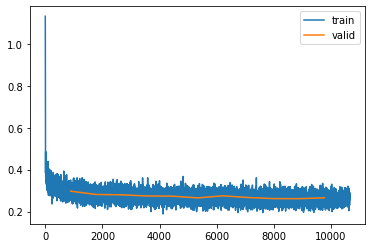

In [ ]:
learn.fit(eps=1e-5,n_epochs=epochs)

In [43]:
checkpoint = torch.load("models/church_mseonly")

In [44]:
lr = checkpoint['optimizer_state_dict']['param_groups'][0]['lr']
betas = checkpoint['optimizer_state_dict']['param_groups'][0]['betas']
eps = checkpoint['optimizer_state_dict']['param_groups'][0]['eps']
weight_decay = checkpoint['optimizer_state_dict']['param_groups'][0]['weight_decay']
amsgrad = checkpoint['optimizer_state_dict']['param_groups'][0]['amsgrad']
foreach = checkpoint['optimizer_state_dict']['param_groups'][0]['foreach']
maximize = checkpoint['optimizer_state_dict']['param_groups'][0]['maximize']
capturable = checkpoint['optimizer_state_dict']['param_groups'][0]['capturable']

In [27]:
model = EmbUNetModel(in_channels=4, out_channels=4, nfs=(128, 256, 512, 768), num_layers=2,
                     attn_start=1, attn_chans=16)
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [32]:
epochs=19
opt_func = partial(optim.AdamW, eps=1e-5)
tmax = epochs * len(dls.train)
sched = partial(lr_scheduler.OneCycleLR, max_lr=lr, total_steps=tmax)
cbs = [DeviceCB(), ProgressCB(plot=True), MetricsCB(), BatchSchedCB(sched), MixedPrecision(),SaveModelCB]

In [33]:
learn = Learner(model, dls, nn.MSELoss(), lr=lr, cbs=cbs, opt_func=opt_func)

loss,epoch,train
0.250,0,train
0.250,0,eval
0.251,1,train
0.245,1,eval
0.250,2,train
0.252,2,eval
0.252,3,train
0.247,3,eval
0.251,4,train
0.252,4,eval


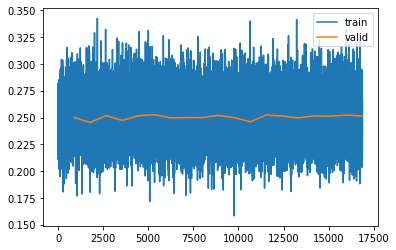

In [34]:
learn.fit(betas=betas,eps=eps,weight_decay=weight_decay,n_epochs=epochs)

## Analzying the loss

The model is trained for a total of 30 epochs. One thing that catches the eye is the loss value being high. If we do Simple diffusion in pixel space, loss is much lower(into 0.03 after 15 epochs).The reason for the loss being high is the complexity of pixel generation in the latent space. 
- Pixel space values directly represent the visual appearance of images and are highly correlated with features such as shapes and textures, where as latent space values provide a more interpretable and lower-dimensional representation of the underlying features and attributes of the data.
- So generating image pixels are much easier as the nearby pixels will have similar values, the background might be same. When you try to generate latent pixels, the task is much more precise about what you want to generate and the error goes up as it is a much more difficult task for the model

# Sampling

Let's look at the samples generated by our model. We use the DDIM sampler for our purpose.

## DDIM Sampler

<!-- ![Alt text](Screenshot.png "Title text") -->
<img src="Screenshot.png" alt="Alternative text"  width="500" height="400"/>

A sampling step in a diffusion model consists of:
- predicting the direction in input space in which we should move to remove noise, or equivalently, to make the input more likely under the data distribution;
- taking a small step in that direction.

The above image shows the main equations that make up the DDIM paper. The σ(sigma) in the above equations is what makes this algorithm deterministic(and the difference from the probalistic predecessor DDPM). As we run this DDIM algorithm once, we get a direction towards the target(input) data distribution and take a step towards that direction.This direction is just an estimate of where our actual data distriution is and is not necessarily the absolute right direction. If we proceed to take a step in this direction and add some noise (as we do in the DDPM sampling algorithm, for example), we end up with $x_{t-1}$,which corresponds to a slightly less noisy input image. The predicted direction now points to a smaller, “more specific” region of high likelihood, because some uncertainty was resolved by the previous sampling step.
We add the noise back to this predicted direction so that the model can explore different regions of the data distribution.

In DDIM, the σ(sigma) controls how muchh noise we add which makes the process deterministic. As we can see from the second equation in the above image, the "random noise" σ$_{t}$ε$_{t}$ is added back. If σ is zero the algorithm becomes completely deterministic and if σ is 1 it is just DDPM. Despite the stochastic nature of adding noise during sampling, the overall sampling process in DDIM can still be considered deterministic in the sense that given the same input (noisy observation) and the same diffusion parameters, the output (sampled image) will be consistent and reproducible.

In [2]:
checkpoint = torch.load("models/church_mseonly")

In [25]:
model = EmbUNetModel(in_channels=4, out_channels=4, nfs=(128, 256, 512, 768), num_layers=2,
                     attn_start=1, attn_chans=16)
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [26]:
model = model.cuda() 

In [27]:
sz = (16,4,32,32)

In [61]:
model = model.cuda()
# set_seed(42)
preds = sample(ddim_step, model, sz, steps=100, eta=1., clamp=False)

In [62]:
s = preds[-1]*5

In [63]:
with torch.no_grad(): pd = to_cpu(vae.decode(s.cuda()))

The samples generated were able to capture the nuances of the scene including the main Church, the background and foreground settings. In some of the generated samples it was able to capture details of humans,or human crowds in the foreground. This is quite remarkable for a model trained just for 3-4 hours on a A1000 gpu card from scratch.

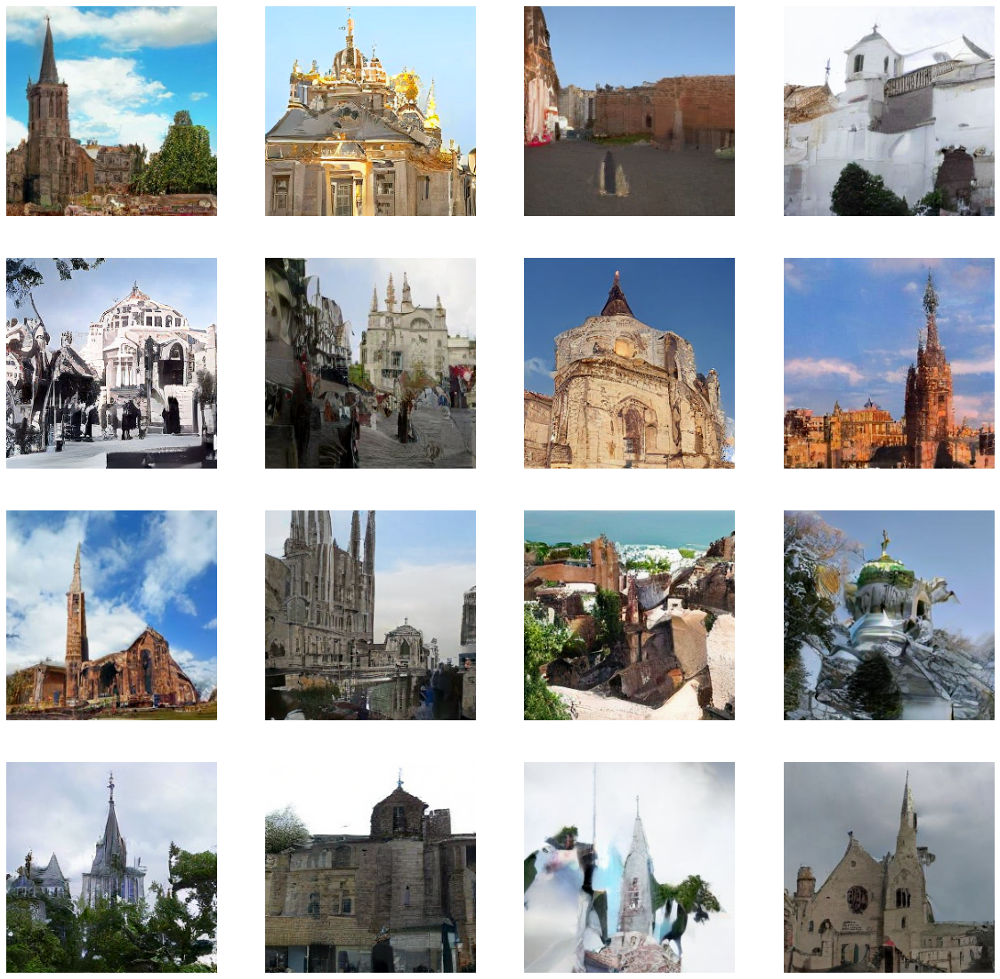

In [64]:
show_images(pd['sample'][:16].clamp(0,1), imsize=5)

 ## Humans in the foreground 

Let's look at this particular sample, where we can see the entire scene of a Church in front of a lake, where boat like structures, flowers and humans on the edge of the boat on the land seem to appear. We can see what looks like a crowd of few people, though the feature details seem to be missing. Nevertheless, the amount of object detail it has captured in the sampling is a huge positive. 

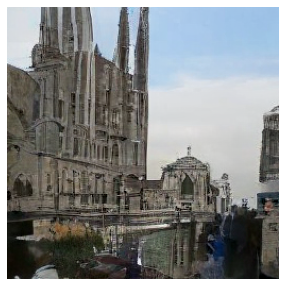

In [68]:
show_images(pd['sample'][9:10].clamp(0,1), imsize=5)

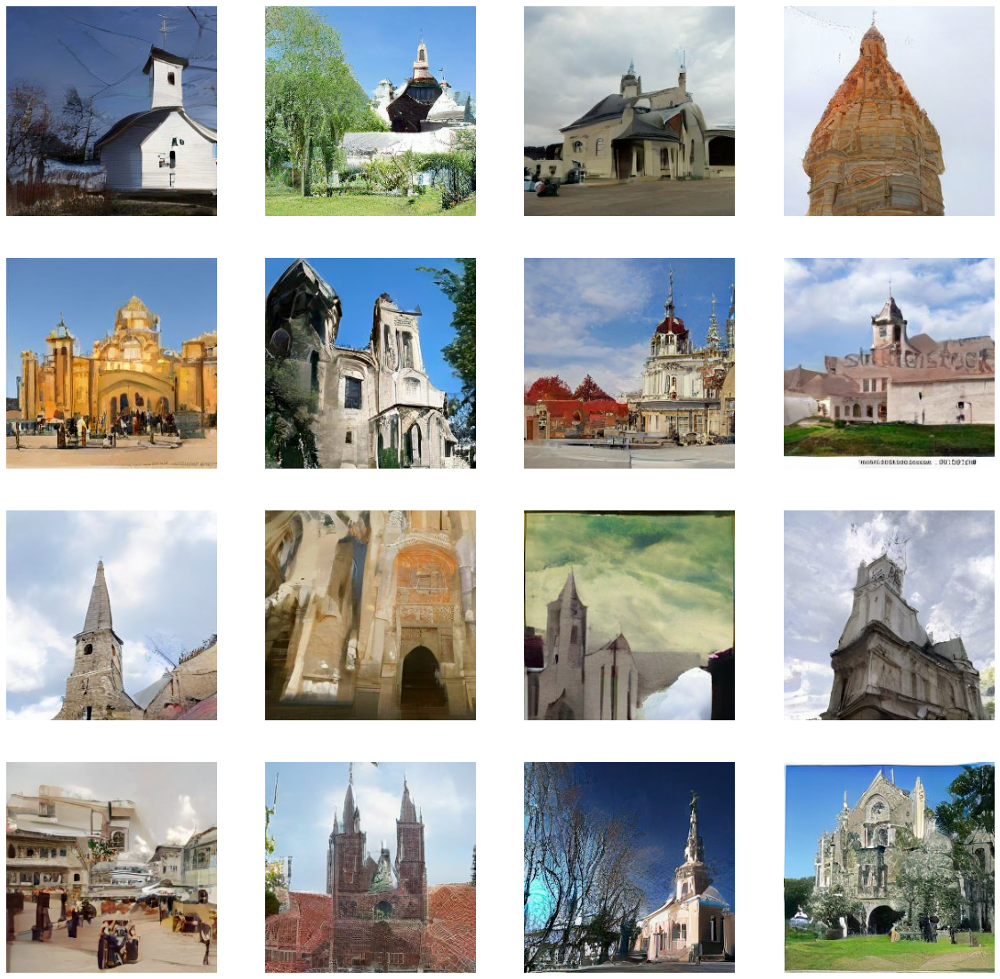

In [31]:
show_images(pd['sample'][:16].clamp(0,1), imsize=5)

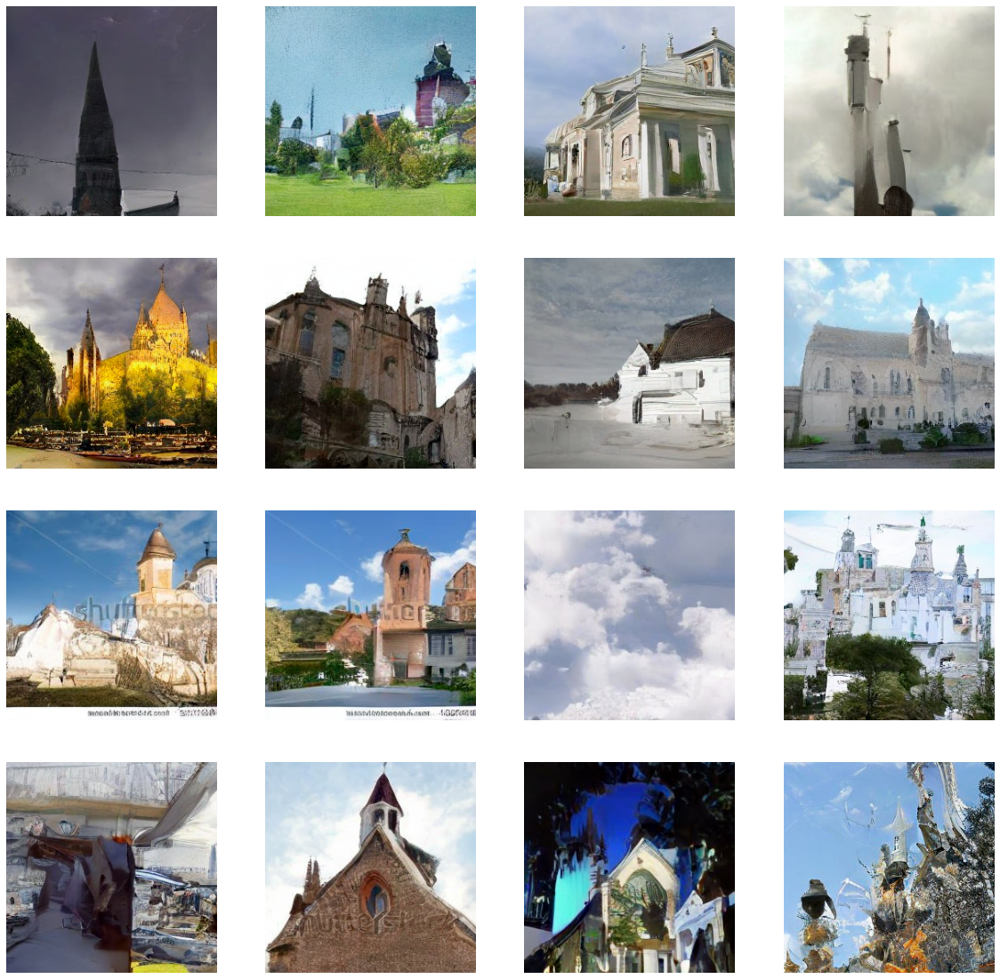

In [44]:
show_images(pd['sample'][:45].clamp(0,1), imsize=5)

# Perceptual Loss

Let's now get into adding a Perceptual image latent loss function to our model. To add the Perceptual Loss function we train our own Imagenet Classifier.

***Training Imagenet Classifier on Encoded Latents***

- Firstly the entire of ImageNet is encoded into their latent representations using a VAE.
- A classification model is then trained on the entire ImageNet training set.
- The head from the classification model is removed and the model’s activations are used as part of the loss function to train a diffusion U-Net model for Latent Diffusion.

A model is created consisting of ResBlocks with dropout to be trained to classify the latent representations of the ImageNet images.
The model was trained to 65.7% accuracy for ImageNet classification over 30 epochs with data augmentation, pixel padding them cropping randomly back to 32x32 latent pixels and using Random Erase


<!-- ![Alt text](Screenshot.png "Title text") -->
<img src="Classifier.jpg" alt="Alternative text"  width="500" height="400"/>

In [22]:
len(dls.train)

888

In [92]:
def init_ddpm(model):
    for o in model.downs:
        for p in o.resnets: p.conv2[-1].weight.data.zero_()

    for o in model.ups:
        for p in o.resnets: p.conv2[-1].weight.data.zero_()

In [93]:
act_gr = partial(GeneralRelu, leak=0.1, sub=0.4)
def conv(ni, nf, ks=3, stride=1, act=nn.ReLU, norm=None, bias=True):
    layers = []
    if norm: layers.append(norm(ni))
    if act : layers.append(act())
    layers.append(nn.Conv2d(ni, nf, stride=stride, kernel_size=ks, padding=ks//2, bias=bias))
    return nn.Sequential(*layers)

def _conv_block(ni, nf, stride, act=act_gr, norm=None, ks=3):
    return nn.Sequential(conv(ni, nf, stride=1     , act=act, norm=norm, ks=ks),
                         conv(nf, nf, stride=stride, act=act, norm=norm, ks=ks))

class ResBlock(nn.Module):
    def __init__(self, ni, nf, stride=1, ks=3, act=act_gr, norm=None):
        super().__init__()
        self.convs = _conv_block(ni, nf, stride, act=act, ks=ks, norm=norm)
        self.idconv = fc.noop if ni==nf else conv(ni, nf, ks=1, stride=1, act=None, norm=norm)
        self.pool = fc.noop if stride==1 else nn.AvgPool2d(2, ceil_mode=True)

    def forward(self, x): return self.convs(x) + self.idconv(self.pool(x))

def res_blocks(n_bk, ni, nf, stride=1, ks=3, act=act_gr, norm=None):
    return nn.Sequential(*[
        ResBlock(ni if i==0 else nf, nf, stride=stride if i==n_bk-1 else 1, ks=ks, act=act, norm=norm)
        for i in range(n_bk)])

def get_dropmodel(nfs, nbks, act=act_gr, norm=nn.BatchNorm2d, drop=0.2):
    layers = [nn.Conv2d(4, nfs[0], 5, padding=2)]
    layers += [res_blocks(nbks[i], nfs[i], nfs[i+1], act=act, norm=norm, stride=2)
               for i in range(len(nfs)-1)]
    layers += [act_gr(), norm(nfs[-1]), nn.AdaptiveAvgPool2d(1), nn.Flatten(), nn.Dropout(drop)]
    layers += [nn.Linear(nfs[-1], 1000, bias=False), nn.BatchNorm1d(1000)]
    return nn.Sequential(*layers).apply(iw)

In [94]:
#latent classifier model 65.8% accuracte model trained on on imageNet
cmodel = torch.load('models/imgnet-latents').cuda()

In [95]:
#remove the last 4 layers of the classifier model
for i in range(4,len(cmodel)): del(cmodel[4])

In [106]:
#MSE & latent perceptual loss
def comb_loss(inp, tgt):
    with torch.autocast('cuda'):
        with torch.no_grad(): tgt_feat = cmodel(tgt).float()
        inp_feat = cmodel(inp).float()
    feat_loss = F.mse_loss(inp_feat, tgt_feat)
    return F.mse_loss(inp,tgt) + feat_loss*0.01

In [107]:
# PATH = f"models/church_perceptual"
class SaveModelCallback(Callback):
    def __init__(self, device=def_device): fc.store_attr()
    def after_epoch(self, learn):
         if (learn.epoch + 1) % 4 == 0:  # Check if current epoch is a multiple of 4
            save_path = f"models/church_perceptual_new{learn.epoch+1}"
            for i in range(learn.n_epochs):
                    torch.save({'epoch': i+1,'model_state_dict': learn.model.state_dict(),'optimizer_state_dict': learn.opt.state_dict(),}, save_path)

In [108]:
SaveModelCB = SaveModelCallback()

In [109]:
lr = 1e-3
epochs = 30
opt_func = partial(optim.AdamW, eps=1e-5)
tmax = epochs * len(dls.train)
sched = partial(lr_scheduler.OneCycleLR, max_lr=lr, total_steps=tmax)
cbs = [DeviceCB(), ProgressCB(plot=True), MetricsCB(), BatchSchedCB(sched), MixedPrecision(),SaveModelCB]
model = EmbUNetModel(in_channels=4, out_channels=4, nfs=(128, 256, 512, 768), num_layers=2,
                     attn_start=1, attn_chans=16)
init_ddpm(model)
learn = Learner(model, dls, comb_loss, lr=lr, cbs=cbs, opt_func=opt_func)

In [1]:
learn.fit(eps=1e-5,n_epochs=epochs)

# Sampling

In [10]:
checkpoint = torch.load("models/church_perceptual44")

In [11]:
model = EmbUNetModel(in_channels=4, out_channels=4, nfs=(128, 256, 512, 768), num_layers=2,
                     attn_start=1, attn_chans=16)
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [12]:
model = model.cuda()

In [33]:
sz = (16,4,32,32)

In [46]:
preds = sample(ddim_step, model, sz, steps=100, eta=1., clamp=False)

In [47]:
s = preds[-1]*5

In [48]:
with torch.no_grad(): pd = to_cpu(vae.decode(s.cuda()))

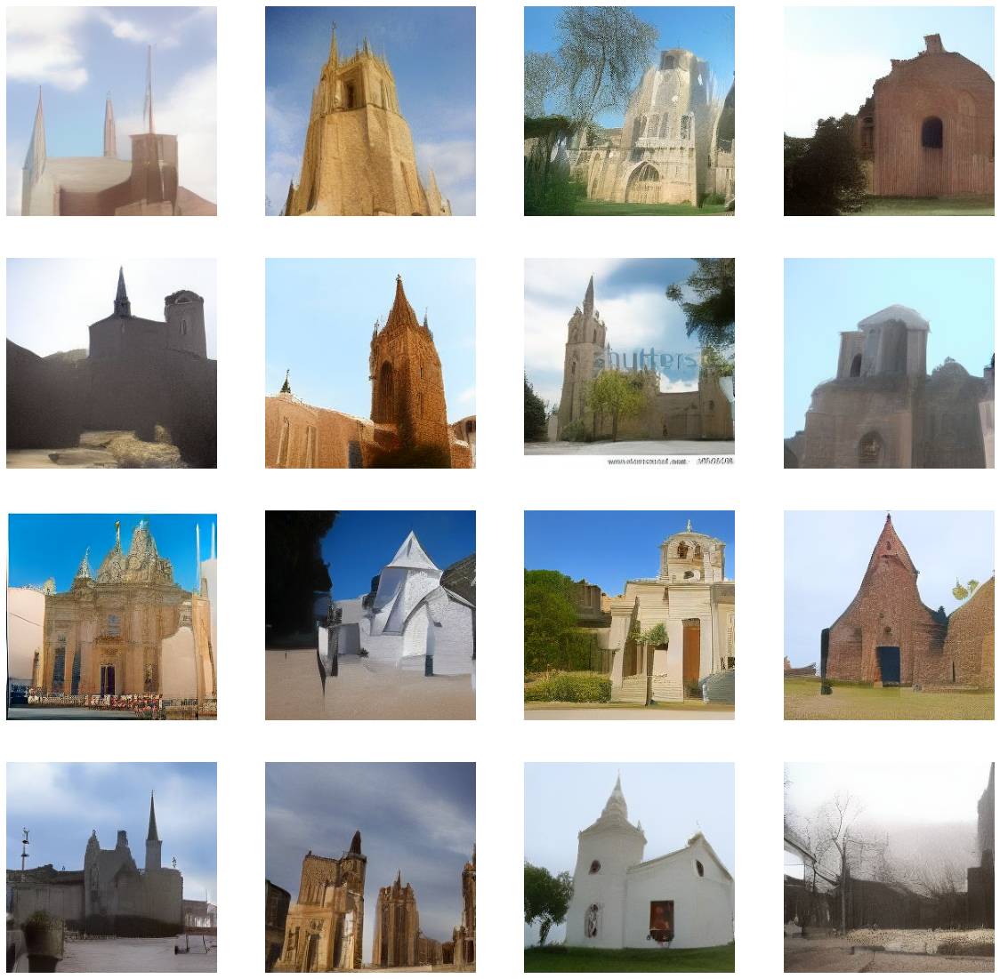

In [62]:
# 44 EPOCHS
show_images(pd['sample'][:16].clamp(0,1), imsize=5)

It is hard to say that we have done better with this Perceptual loss diffusion model. Even though the entire scene of the images generated looks a bit like pencil drawing sketches, and not as real and close to our input distribution as the diffusion model trained with MSE loss was.One thing that stands out is that it's still consistent and detailed with the church structures it has created. As the model used for perceptual loss was a classifer trained on Imagenet to predict different object classes, it still does well on the main object(i.e the Church itself). The temperature, color, background,foreground(etc) of the generated images are undercooked and not very convincing. Let's have a look at one of the images closer below.
You can see the brick detailing, broken edges which make a compelling church image.

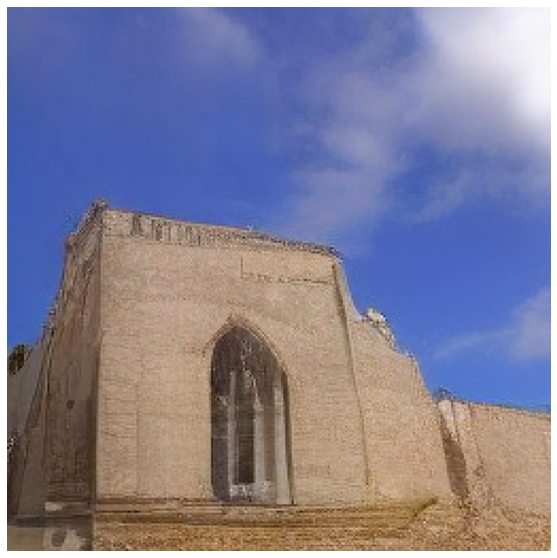

In [41]:
# 44 EPOCHS
show_images(pd['sample'][10:11].clamp(0,1), imsize=10)

## Conclusion

Today, we generated Church images by training 2 diffusion models, one with MSE loss and the other with added perceptual loss. The pieces we scraped together to generate images and train these models were our very own. Considering the dataset we used was very small(for a generative model trained from scratch), and each of the model trained for just 3-4 hours on a 16Gb A1000 card, we got promising results.

Another way to add perceptual loss is to treat the diffusion model itself as the network which will generate meaningful perceptual loss. This technique claims to have generated better unconditional samples against models trained with just MSE loss. 